In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = 'C:\Program Files (x86)\ffmpeg\bin'
plt.rcParams["animation.embed_limit"] = 100.0
from IPython.display import HTML
import matplotlib.animation as animation
from celluloid import Camera
np.random.seed(0)


In [2]:
ims = []

In [3]:
def quicksort(arr, l, h):
    if h-l > 0:
        p = partition(arr, l, h)
        quicksort(arr, l, p-1)
        quicksort(arr, p+1, h)


def partition(arr, l, h):
    p = h
    firsthigh = l
    for i in range(l, h):
        if arr[i] < arr[p]:
            arr[i], arr[firsthigh] = arr[firsthigh], arr[i]
            ims.append(np.copy(arr))
            firsthigh += 1
    arr[p], arr[firsthigh] = arr[firsthigh], arr[p]
    ims.append(np.copy(arr))
    return firsthigh

In [4]:
arr = np.arange(100)
np.random.shuffle(arr)
sorted_arr = np.copy(arr)

In [5]:
quicksort(sorted_arr, 0, len(arr) - 1)

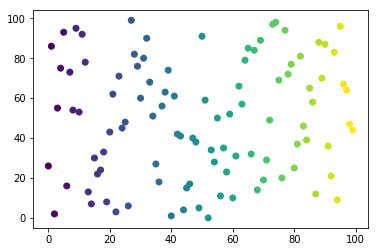

In [6]:
indices = np.arange(len(arr))
fig, ax = plt.subplots()


scat = ax.scatter(indices, arr, c=indices, cmap='viridis')

In [7]:
def animate(i):
    data = np.column_stack((indices, ims[i]))
    #print(data)
    scat.set_offsets(data)
    #scat.set_color(data)
    return scat,

In [8]:
anim = animation.FuncAnimation(fig, animate, frames=range(len(ims)),
                               interval=200)


In [9]:
HTML(anim.to_jshtml())


In [ ]:
#anim.save('quicksort.gif')